Based on https://www.kaggle.com/code/maxdiazbattan/wallmart-sales-top-3-eda-feature-engineering

Good prediction pipeline and result in the competition. Worth to try and follow


In [1]:
# Data handling
import pandas as pd
import numpy as np

# Viz
import plotly.express as px
import plotly.graph_objs as go
import plotly.figure_factory as ff
import matplotlib
import matplotlib.pyplot as plt

# Sklearn
from sklearn import model_selection, metrics
from sklearn.inspection import permutation_importance

# Models
import xgboost as xgb
import lightgbm as lgb
from sklearn import linear_model, ensemble

from sklearn.experimental import enable_hist_gradient_boosting
from sklearn.ensemble import HistGradientBoostingRegressor

# Remove warnings
import warnings
warnings.filterwarnings('ignore') 

C:\Users\USER\anaconda3\envs\AI\Lib\site-packages\sklearn\experimental\enable_hist_gradient_boosting.py:16: UserWarning: Since version 1.0, it is not needed to import enable_hist_gradient_boosting anymore. HistGradientBoostingClassifier and HistGradientBoostingRegressor are now stable and can be normally imported from sklearn.ensemble.
  warnings.warn(


In [2]:
features = pd.read_csv('./data/features.csv.zip')
train = pd.read_csv('./data/train.csv.zip')
stores = pd.read_csv('./data/stores.csv')
test = pd.read_csv('./data//test.csv.zip')
sample_submission = pd.read_csv('./data/sampleSubmission.csv.zip')

In [3]:
feature_store = features.merge(stores, how='inner', on = "Store")

In [4]:
train_df = train.merge(feature_store, how='inner', on = ['Store','Date','IsHoliday']).sort_values(by=['Store','Dept','Date']).reset_index(drop=True)

In [5]:
test_df = test.merge(feature_store, how='inner', on = ['Store','Date','IsHoliday']).sort_values(by = ['Store','Dept','Date']).reset_index(drop=True)

In [6]:
feature_store = features.merge(stores, how='inner', on = "Store")

# Converting date column to datetime 
feature_store['Date'] = pd.to_datetime(feature_store['Date'])
train['Date'] = pd.to_datetime(train['Date'])
test['Date'] = pd.to_datetime(test['Date'])

# Adding some basic datetime features
feature_store['Day'] = feature_store['Date'].dt.day
feature_store['Week'] = feature_store['Date'].dt.isocalendar().week
feature_store['Month'] = feature_store['Date'].dt.month
feature_store['Year'] = feature_store['Date'].dt.year

In [7]:
train_df = train.merge(feature_store, how='inner', on = ['Store','Date','IsHoliday']).sort_values(by=['Store','Dept','Date']).reset_index(drop=True)

In [8]:
test_df = test.merge(feature_store, how='inner', on = ['Store','Date','IsHoliday']).sort_values(by = ['Store','Dept','Date']).reset_index(drop=True)

##### EDA of the Wallmart Dataset

In [9]:
# date is not liked by describe we delete it from the describe
# This is a nice code snipet to see the contents of a Dataframe coloring outliers and extremes

cols = train_df.columns
a = cols[3:]

train_df[cols[3:]].describe().T.style.bar(subset=['mean'], color='#205ff2')\
                            .set_caption("Stats Summary of Numeric Variables")\
                            .background_gradient(subset=['min'], cmap='Reds')\
                            .background_gradient(subset=['max'], cmap='Greens')\
                            .background_gradient(subset=['std'], cmap='GnBu')\
                            .background_gradient(subset=['50%'], cmap='GnBu')

,count,mean,std,min,25%,50%,75%,max
Weekly_Sales,421570.000000,15981.258123,22711.183519,-4988.940000,2079.650000,7612.030000,20205.852500,693099.360000
Temperature,421570.000000,60.090059,18.447931,-2.060000,46.680000,62.090000,74.280000,100.140000
Fuel_Price,421570.000000,3.361027,0.458515,2.472000,2.933000,3.452000,3.738000,4.468000
MarkDown1,150681.000000,7246.420196,8291.221345,0.270000,2240.270000,5347.450000,9210.900000,88646.760000
MarkDown2,111248.000000,3334.628621,9475.357325,-265.760000,41.600000,192.000000,1926.940000,104519.540000
MarkDown3,137091.000000,1439.421384,9623.078290,-29.100000,5.080000,24.600000,103.990000,141630.610000
MarkDown4,134967.000000,3383.168256,6292.384031,0.220000,504.220000,1481.310000,3595.040000,67474.850000
MarkDown5,151432.000000,4628.975079,5962.887455,135.160000,1878.440000,3359.450000,5563.800000,108519.280000
CPI,421570.000000,171.201947,39.159276,126.064000,132.022667,182.318780,212.416993,227.232807
Unemployment,421570.000000,7.960289,1.863296,3.879000,6.891000,7.866000,8.572000,14.313000


In [10]:
palletes = {
   'continuos':{'blues': ['#03045E', '#023E8A', '#0077B6', '#0077B6', '#0096C7', '#00B4D8', '#48CAE4', '#90E0EF', '#ADE8F4', '#CAF0F8'],
                'green_n_blues': ['#D9ED92', '#B5E48C', '#99D98C', '#76C893', '#52B69A', '#34A0A4', '#168AAD', '#1A759F', '#1E6091', '#184E77']
               }
            }

In [11]:
template = dict(layout=go.Layout(font=dict(family="Enriqueta", size=12))) # Cabin | Franklin Bold

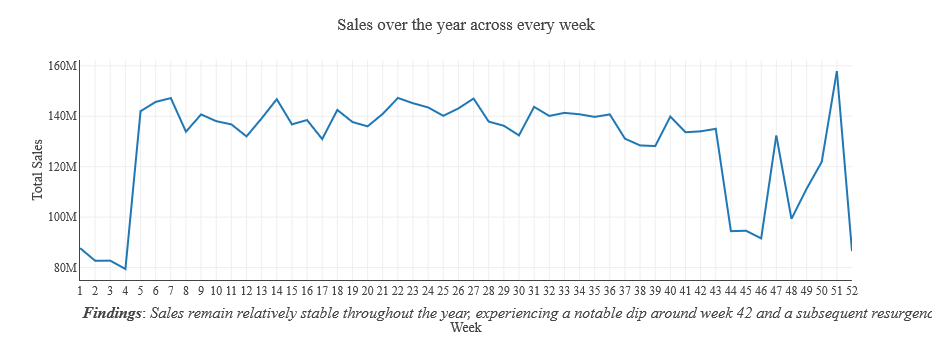

In [12]:
df_weeks = train_df.groupby('Week').sum(numeric_only=True)

fig = px.line(data_frame=df_weeks, x=df_weeks.index, y='Weekly_Sales', 
              template='simple_white', 
              labels={'Weekly_Sales' : 'Total Sales', 'x' : 'Weeks'})

fig.update_layout(
    template=template, 
    title={'text':'Sales over the year across every week'},
    xaxis=dict(tickmode='linear', showline=True), 
    yaxis=dict(showline=True))

fig.add_annotation(
    x=0, y=-0.2, 
    align='left', 
    font=dict(size=12),
    textangle=0, 
    xref="paper", 
    yref="paper", 
    showarrow=False,
    text="<span style='font-size:16px;'><b><i>Findings</b></i>: <i>Sales remain relatively stable throughout the year, experiencing a notable dip around week 42 and a subsequent resurgence during the holiday season.</i>", )

#### Markdowns relationship with sales 

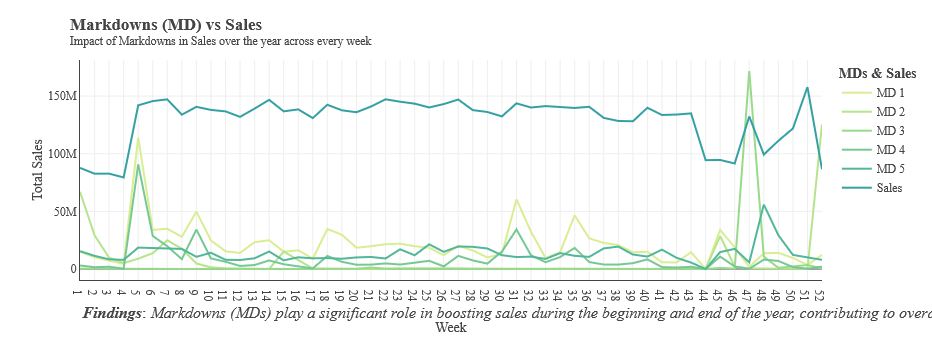

In [13]:
legend_names = {'MarkDown1': "MD 1",
                'MarkDown2': 'MD 2',
                'MarkDown3': 'MD 3',
                'MarkDown4': 'MD 4',
                'MarkDown5': 'MD 5',
                'Weekly_Sales': 'Sales'}


fig = px.line(df_weeks, x=df_weeks.index, y=['MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4', 'MarkDown5', 'Weekly_Sales'], 
              color_discrete_sequence=palletes['continuos']['green_n_blues'],
              template='simple_white', 
              labels={'value' : 'Total Sales', 'x' : 'Weeks'})

for trace_index, trace in enumerate(fig.data):
    trace.name = legend_names[trace.name]

fig.update_layout(
    template=template, 
    title={'text':'<b>Markdowns (MD) vs Sales</b><br><sup>Impact of Markdowns in Sales over the year across every week</sup>', 'x': 0.075},
    legend_title_text='<b>MDs & Sales</b>',
    xaxis=dict(tickmode='linear', showline=True), 
    yaxis=dict(showline=True))

fig.add_annotation(
    x=0, y=-0.2, 
    align='left', 
    font=dict(size=12),
    textangle=0, 
    xref="paper", 
    yref="paper", 
    showarrow=False,
    text="<span style='font-size:16px;'><b><i>Findings</b></i>: <i>Markdowns (MDs) play a significant role in boosting sales during the beginning and end of the year, contributing to overall sales stability.</i>")

##### Mean sales comparassion across the years  

In [14]:
weekly_sales = train_df.groupby(['Year','Week'], as_index = False).agg({'Weekly_Sales': ['mean', 'median']})
weekly_sales2010 = train_df.loc[train_df['Year']==2010].groupby(['Week']).agg({'Weekly_Sales': ['mean', 'median']})
weekly_sales2011 = train_df.loc[train_df['Year']==2011].groupby(['Week']).agg({'Weekly_Sales': ['mean', 'median']})
weekly_sales2012 = train_df.loc[train_df['Year']==2012].groupby(['Week']).agg({'Weekly_Sales': ['mean', 'median']})

weekly_sales_data = {
    '2010': weekly_sales2010['Weekly_Sales']['mean'].to_dict(),
    '2011': weekly_sales2011['Weekly_Sales']['mean'].to_dict(),
    '2012': weekly_sales2012['Weekly_Sales']['mean'].to_dict()
}

weekly_sales_df = pd.DataFrame(weekly_sales_data)

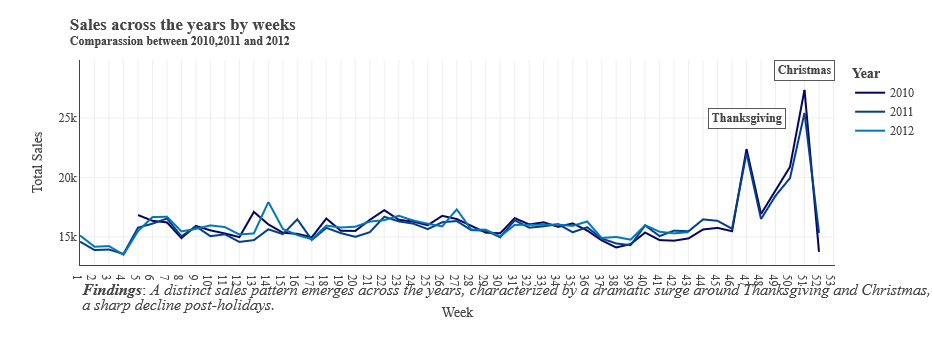

In [15]:
line_columns = ['2010', '2011', '2012']

weekly_sales_df_sorted = weekly_sales_df.sort_index()

fig = px.line(weekly_sales_df_sorted, x=weekly_sales_df_sorted.index, y=line_columns, 
              labels={'x': 'Week', 'value': 'Total Sales'},
              color_discrete_sequence=palletes['continuos']['blues'])


fig.update_layout(
    template=template, 
    margin=dict(b=95),
    title={'text':'<b>Sales across the years by weeks<b><br><sup>Comparassion between 2010,2011 and 2012</sup>', 'x': 0.075}, xaxis_title='Week',
    legend_title_text='<b>Year</b>',
    xaxis=dict(tickmode='linear', showline=True), 
    yaxis=dict(showline=True))

fig.add_annotation(
    x=47, y=25000,
    text="<b>Thanksgiving</b>", 
    bordercolor="#585858",
    showarrow=False, 
    borderpad=2.5, 
    bgcolor='white')

fig.add_annotation(
    x=51, y=29000,
    text="<b>Christmas</b>",  
    bordercolor="#585858", 
    showarrow=False, 
    borderpad=2.5,
    bgcolor='white')

fig.add_annotation(
    x=0, y=-0.25, 
    align='left', 
    font=dict(size=12),
    textangle=0, 
    xref="paper", 
    yref="paper", 
    showarrow=False,
    text="<span style='font-size:16px;'><b><i>Findings</b></i>: <i>A distinct sales pattern emerges across the years, characterized by a dramatic surge around Thanksgiving and Christmas, followed by<br>a sharp decline post-holidays.</i>")

#### Other features analysis

In [16]:
# Converting the temperature to celsius for a better interpretation
train_df['Temperature'] = train_df['Temperature'].apply(lambda x :  (x - 32) / 1.8)
train_df['Temperature'] = train_df['Temperature'].apply(lambda x :  (x - 32) / 1.8)

In [17]:
train_plt = train_df.sample(frac=.1, random_state=42)

##### Temperature     

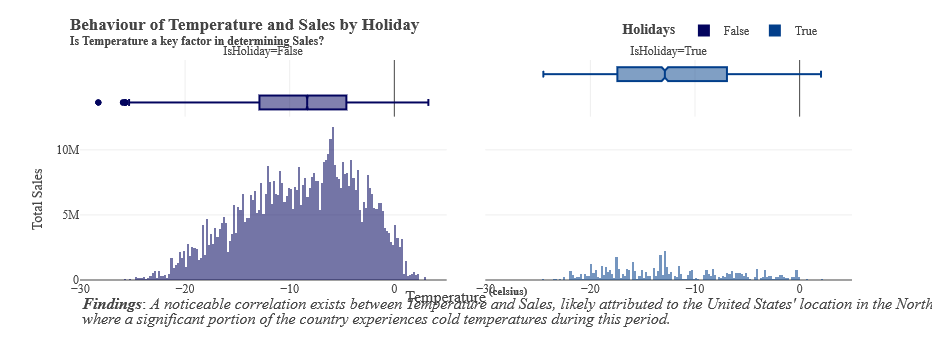

In [18]:
fig = px.histogram(train_plt, x='Temperature', y='Weekly_Sales', color='IsHoliday', marginal='box', opacity=0.55,
                   facet_col='IsHoliday', facet_col_spacing=0.05,
                   color_discrete_sequence=palletes['continuos']['blues'])

fig.update_layout(
    template=template, 
    title={'text':'<b>Behaviour of Temperature and Sales by Holiday<br><sup>Is Temperature a key factor in determining Sales?</sup>', 'x': 0.075}, 
    yaxis_title='Total Sales', xaxis_title=' ',
    legend_title_text='<b>Holidays</b>',
    legend=dict(orientation="h", yanchor="top", x=0.7, y=1.2))

fig.for_each_xaxis(
    lambda x: x.update(title=''))

fig.add_annotation(
    x=0.5, y=-0.125, 
    align='center', 
    font=dict(size=12),
    textangle=0, 
    xref="paper", 
    yref="paper", 
    showarrow=False,
    text="<span style='font-size:16px;'>Temperature<sup><b> (celsius)</b>")

fig.add_annotation(
    x=0, y=-0.225, 
    align='left', 
    font=dict(size=12),
    textangle=0, 
    xref="paper", 
    yref="paper", 
    showarrow=False,
    text="<span style='font-size:16px;'><b><i>Findings</b></i>: <i>A noticeable correlation exists between Temperature and Sales, likely attributed to the United States' location in the Northern Hemisphere,<br>where a significant portion of the country experiences cold temperatures during this period.</i>")

##### Fuel Price       

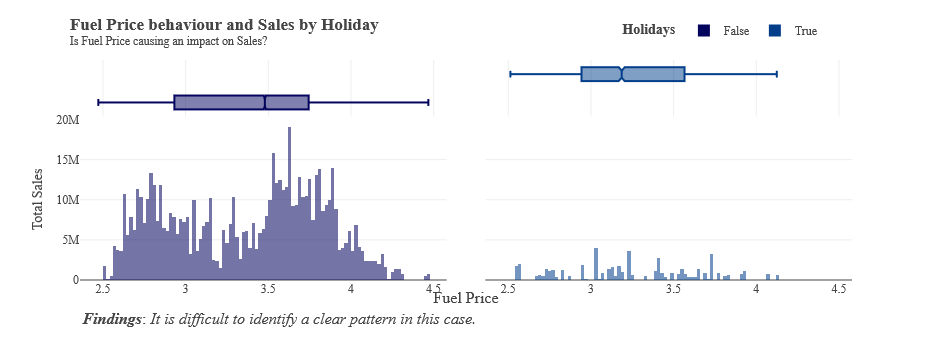

In [19]:
fig=px.histogram(train_plt, x='Fuel_Price', y ='Weekly_Sales', color='IsHoliday', marginal='box', opacity= 0.55,
                 facet_col='IsHoliday', facet_col_spacing=0.05,
                 color_discrete_sequence=palletes['continuos']['blues'])

fig.update_layout(template=template, 
                  title={'text':'<b>Fuel Price behaviour and Sales by Holiday</b><br><sup>Is Fuel Price causing an impact on Sales?</sup>', 'x': 0.075}, 
                  yaxis_title='Total Sales', xaxis_title='',
                  legend_title_text='<b>Holidays</b>',
                  legend=dict(orientation="h", yanchor="top", x=0.7, y=1.2))

fig.for_each_xaxis(
    lambda x: x.update(title=''))

fig.for_each_annotation(
    lambda x: x.update(text=''))

fig.add_annotation(
    x=0.5, y=-0.125, 
    align='center', 
    font=dict(size=12),
    textangle=0, 
    xref="paper", 
    yref="paper", 
    showarrow=False,
    text="<span style='font-size:16px;'>Fuel Price")

fig.add_annotation(
    x=0, y=-0.225, 
    align='left', 
    font=dict(size=12),
    textangle=0, 
    xref="paper", 
    yref="paper", 
    showarrow=False,
    text="<span style='font-size:16px;'><b><i>Findings</b></i>: <i>It is difficult to identify a clear pattern in this case.</i>")

##### Consumer Price Index (CPI)


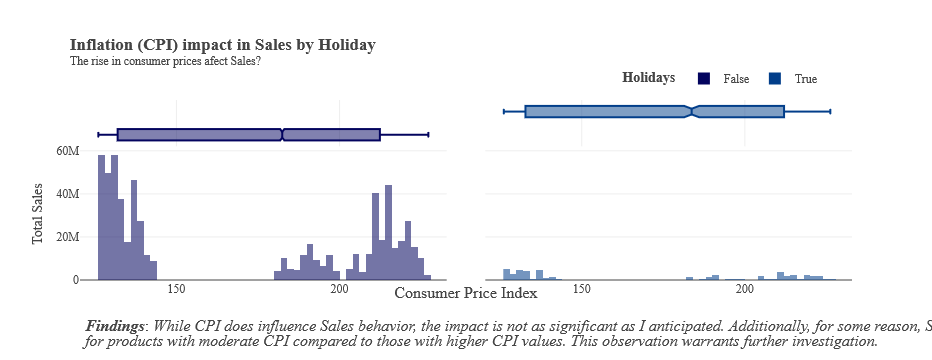

In [20]:
fig = px.histogram(train_plt, x='CPI', y ='Weekly_Sales', color='IsHoliday', marginal='box', opacity= 0.55,
                   facet_col='IsHoliday', facet_col_spacing=0.05,
                   title='CPI and sales by holiday',color_discrete_sequence=palletes['continuos']['blues'])

fig.update_layout(
    template=template, 
    title={'text':'<b>Inflation (CPI) impact in Sales by Holiday</b><br><sup>The rise in consumer prices afect Sales?</sup>', 'x': 0.075}, 
    yaxis_title='Total Sales', xaxis_title='',
    legend_title_text='<b>Holidays</b>',
    legend=dict(orientation="h", yanchor="top", x=0.7, y=1.2))

fig.for_each_xaxis(
    lambda x: x.update(title=''))

fig.for_each_annotation(
    lambda x: x.update(text=''))

fig.add_annotation(
    x=0.5, y=-0.125, 
    align='center', 
    font=dict(size=12),
    textangle=0, 
    xref="paper", 
    yref="paper", 
    showarrow=False,
    text="<span style='font-size:16px;'>Consumer Price Index")

fig.add_annotation(
    x=0, y=-0.4, 
    align='left', 
    font=dict(size=12),
    textangle=0, 
    xref="paper", 
    yref="paper", 
    showarrow=False,
    text="<span style='font-size:16px;'><b><i>Findings</b></i>: <i>While CPI does influence Sales behavior, the impact is not as significant as I anticipated. Additionally, for some reason, Sales Holidays tend to be lower<br>for products with moderate CPI compared to those with higher CPI values. This observation warrants further investigation.</i>")

##### Unemployment        

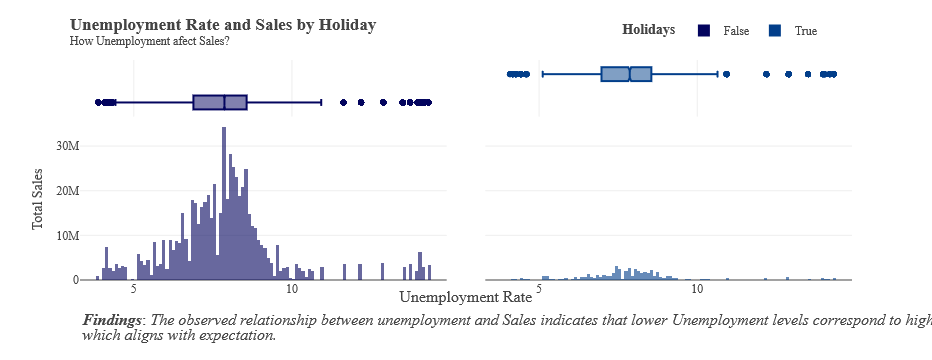

In [21]:
fig = px.histogram(train_plt, x='Unemployment', y ='Weekly_Sales', color='IsHoliday', marginal='box', opacity= 0.6,
                   facet_col='IsHoliday', facet_col_spacing=0.05,
                   color_discrete_sequence=palletes['continuos']['blues'])

fig.update_layout(
    template=template, 
    title={'text':'<b>Unemployment Rate and Sales by Holiday</b><br><sup>How Unemployment afect Sales?</sup>', 'x': 0.075}, 
    yaxis_title='Total Sales', xaxis_title='',
    legend_title_text='<b>Holidays</b>',
    legend=dict(orientation="h", yanchor="top", x=0.7, y=1.2))

fig.for_each_xaxis(
    lambda x: x.update(title=''))

fig.for_each_annotation(
    lambda x: x.update(text=''))

fig.add_annotation(
    x=0.5, y=-0.125, 
    align='center', 
    font=dict(size=12),
    textangle=0, 
    xref="paper", 
    yref="paper", 
    showarrow=False,
    text="<span style='font-size:16px;'>Unemployment Rate")

fig.add_annotation(
    x=0, y=-0.3, 
    align='left', 
    font=dict(size=12),
    textangle=0, 
    xref="paper", 
    yref="paper", 
    showarrow=False,
    text="<span style='font-size:16px;'><b><i>Findings</b></i>: <i>The observed relationship between unemployment and Sales indicates that lower Unemployment levels correspond to higher Sales figures,<br>which aligns with expectation.</i>")

##### Store Sizes, Types & Sales     

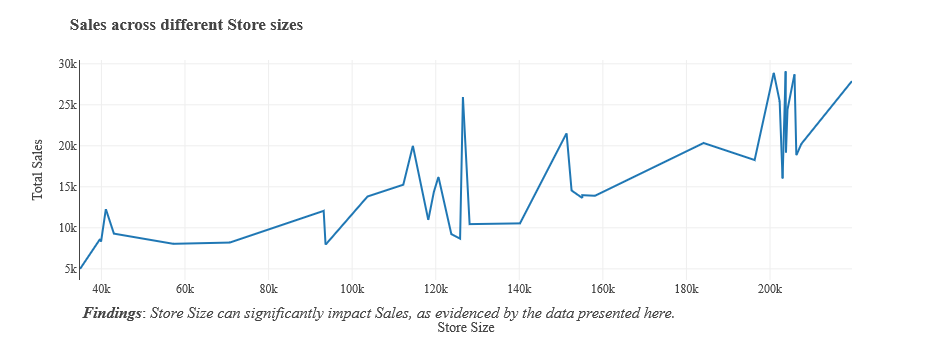

In [22]:
sizes = train_plt.groupby('Size').mean(numeric_only=True)
fig = px.line(sizes, x = sizes.index, y = sizes.Weekly_Sales, template='simple_white',
              labels={'Weekly_Sales' : 'Total Sales', 'Size' : 'Store Size'})

fig.update_layout(
    template=template, 
    title={'text':'<b>Sales across different Store sizes</b>', 'x': 0.075},
    yaxis=dict(showline=True))

fig.add_annotation(
    x=0, y=-0.2, 
    align='left', 
    font=dict(size=12),
    textangle=0, 
    xref="paper", 
    yref="paper", 
    showarrow=False,
    text="<span style='font-size:16px;'><b><i>Findings</b></i>: <i>Store Size can significantly impact Sales, as evidenced by the data presented here.</i>", )

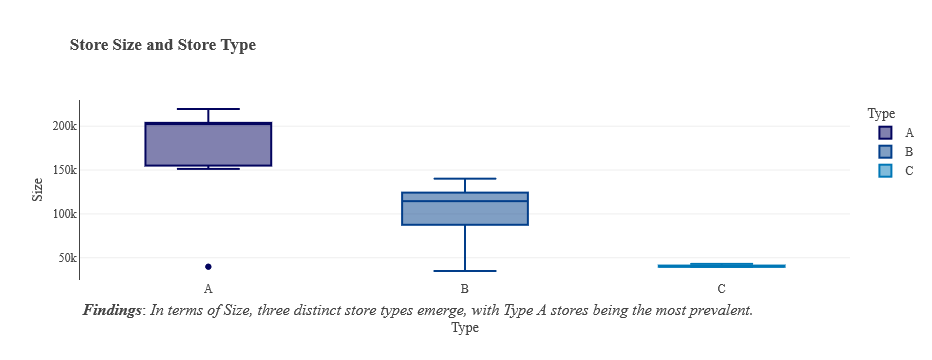

In [23]:
store_type = pd.concat([stores['Type'], stores['Size']], axis=1)

fig = px.box(store_type, x='Type', y='Size', color='Type', 
             title='Store size and Store type',
             color_discrete_sequence=palletes['continuos']['blues'])

fig.update_layout(
    template=template, 
    title={'text':'<b>Store Size and Store Type</b>', 'x': 0.075},
    yaxis_title='Size', 
    xaxis_title='Type',
    yaxis=dict(showline=True))

fig.add_annotation(
    x=0, y=-0.225, 
    align='left', 
    font=dict(size=12),
    textangle=0, 
    xref="paper", 
    yref="paper", 
    showarrow=False,
    text="<span style='font-size:16px;'><b><i>Findings</b></i>: <i>In terms of Size, three distinct store types emerge, with Type A stores being the most prevalent.</i>")

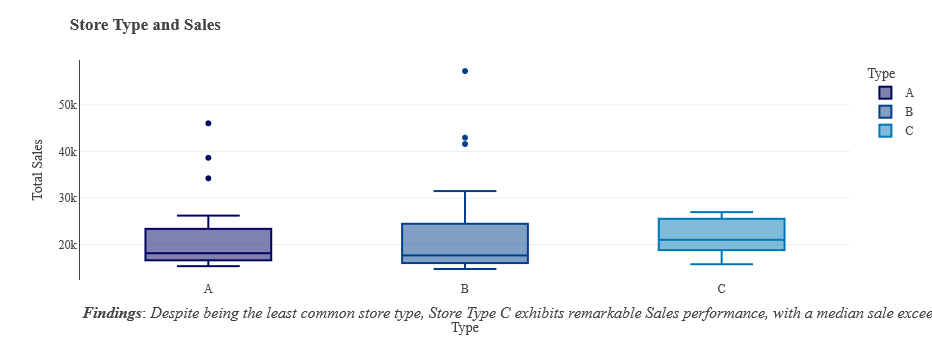

In [24]:
store_sale = pd.concat([stores['Type'], train_df['Weekly_Sales']], axis=1)

fig = px.box(store_sale.dropna(), x='Type', y='Weekly_Sales', color='Type', 
             color_discrete_sequence=palletes['continuos']['blues'])

fig.update_layout(
    template=template, 
    title={'text':'<b>Store Type and Sales</b>', 'x': 0.075},
    yaxis_title='Total Sales', 
    xaxis_title='Type',
    yaxis=dict(showline=True))

fig.add_annotation(
    x=0, y=-0.2, 
    align='left', 
    font=dict(size=12),
    textangle=0, 
    xref="paper", 
    yref="paper", 
    showarrow=False,
    text="<span style='font-size:16px;'><b><i>Findings</b></i>: <i>Despite being the least common store type, Store Type C exhibits remarkable Sales performance, with a median sale exceeding the other two store types.</i>")

##### Departments       

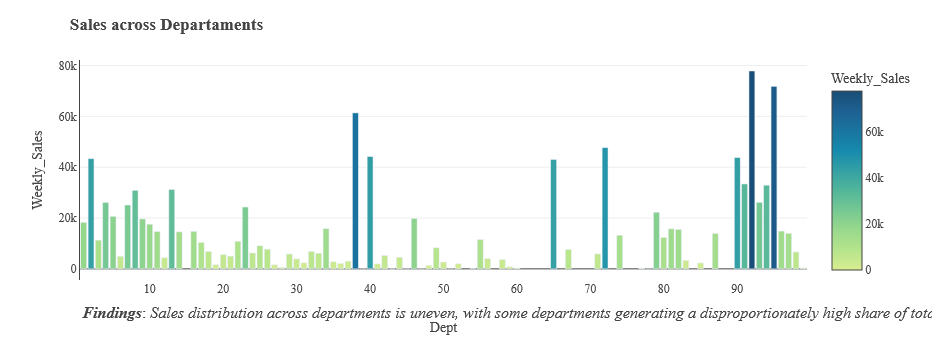

In [25]:
depts = train_plt.groupby('Dept').mean(numeric_only = True).sort_values(by='Weekly_Sales', ascending=False)

fig = px.bar(depts, x=depts.index, y=depts.Weekly_Sales, color=depts.Weekly_Sales, 
             color_continuous_scale=palletes['continuos']['green_n_blues'])

fig.update_layout(
    template=template, 
    title={'text':'<b>Sales across Departaments</b>', 'x': 0.075},
    legend_title_text='<b>Sales</b>',
    yaxis=dict(showline=True))

fig.add_annotation(
    x=0, y=-0.20, 
    align='left', 
    font=dict(size=12),
    textangle=0, 
    xref="paper", 
    yref="paper", 
    showarrow=False,
    text="<span style='font-size:16px;'><b><i>Findings</b></i>: <i>Sales distribution across departments is uneven, with some departments generating a disproportionately high share of total sales.</i>")

#### Heatmap and correlation between features

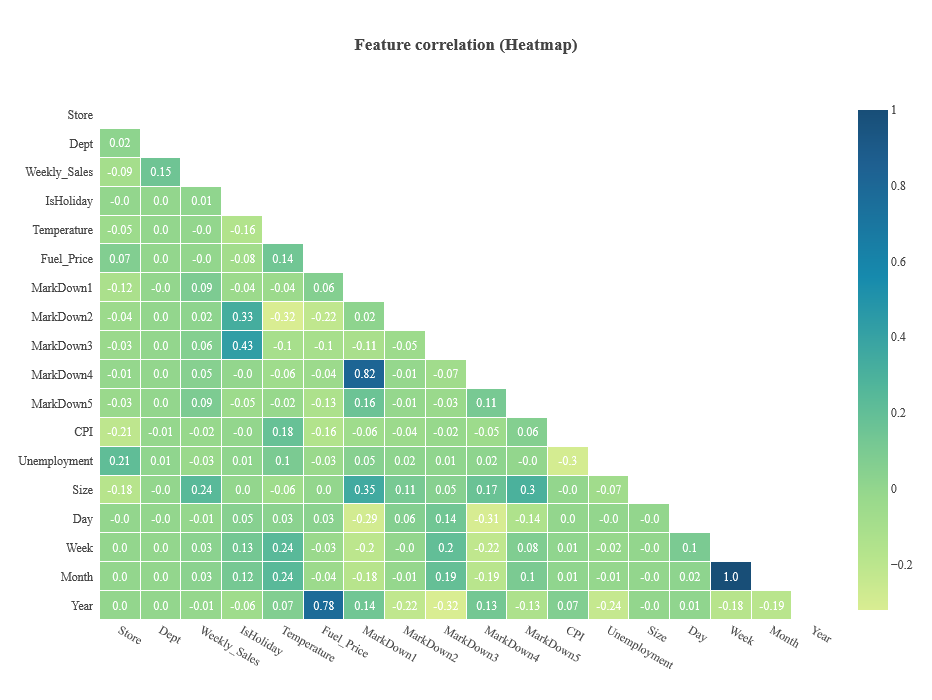

In [26]:
corr = train_df.corr(numeric_only = True)
mask = np.triu(np.ones_like(corr, dtype=bool))
df_mask = corr.mask(mask).round(2)

fig = ff.create_annotated_heatmap(z=df_mask.to_numpy(), 
                                  x=df_mask.columns.tolist(),
                                  y=df_mask.columns.tolist(),
                                  colorscale=palletes['continuos']['green_n_blues'],
                                  hoverinfo="none", 
                                  showscale=True, ygap=1, xgap=1)

fig.update_xaxes(side="bottom")

fig.update_layout(
    template=template, 
    width=900, 
    height=700,
    margin=dict(l=100),
    title={'text':'<b>Feature correlation (Heatmap)</b>', 'x': 0.075},
    title_x=0.5, 
    xaxis_showgrid=False,
    yaxis_showgrid=False,
    xaxis_zeroline=False,
    yaxis_zeroline=False,
    yaxis_autorange='reversed',
)

for i in range(len(fig.layout.annotations)):
    if fig.layout.annotations[i].text == 'nan':
        fig.layout.annotations[i].text = ""

fig.show()

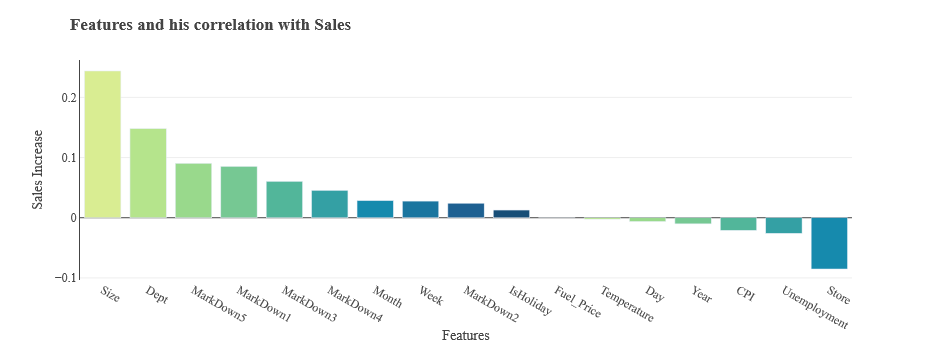

In [27]:
weekly_sales_corr = train_df.corr(numeric_only = True).iloc[2,:]
corr_df = pd.DataFrame(data = weekly_sales_corr, index = weekly_sales_corr.index ).sort_values (by='Weekly_Sales', ascending=False)
corr_df = corr_df.iloc[1:]

fig = px.bar(corr_df, x=corr_df.index, y='Weekly_Sales', color=corr_df.index, labels={'index':'Features'},
             color_discrete_sequence=palletes['continuos']['green_n_blues'])

fig.update_traces(showlegend=False)

fig.update_layout(
    template=template, 
    title={'text':'<b>Features and his correlation with Sales</b>', 'x': 0.075},
    yaxis_title='Sales Increase',
    yaxis=dict(showline=True))

#### Feature engineering 

In [28]:
data_train = train_df.copy()
data_test = test_df.copy()

##### Holidays
Since Thanksgiving and Christmas are the most importarnt holidays, I'm going to try some feature engineering on this features, and also Superbowl and Laborday.


In [29]:
data_train['Days_to_Thansksgiving'] = (pd.to_datetime(train_df["Year"].astype(str)+"-11-24", format="%Y-%m-%d") - pd.to_datetime(train_df["Date"], format="%Y-%m-%d")).dt.days.astype(int)
data_train['Days_to_Christmas'] = (pd.to_datetime(train_df["Year"].astype(str)+"-12-24", format="%Y-%m-%d") - pd.to_datetime(train_df["Date"], format="%Y-%m-%d")).dt.days.astype(int)

In [30]:
data_test['Days_to_Thansksgiving'] = (pd.to_datetime(test_df["Year"].astype(str)+"-11-24", format="%Y-%m-%d") - pd.to_datetime(test_df["Date"], format="%Y-%m-%d")).dt.days.astype(int)
data_test['Days_to_Christmas'] = (pd.to_datetime(test_df["Year"].astype(str)+"-12-24", format="%Y-%m-%d") - pd.to_datetime(test_df["Date"], format="%Y-%m-%d")).dt.days.astype(int)

In [31]:
data_train['SuperBowlWeek'] = train_df['Week'].apply(lambda x: 1 if x == 6 else 0)
data_train['LaborDay'] = train_df['Week'].apply(lambda x: 1 if x == 36 else 0)
data_train['Tranksgiving'] = train_df['Week'].apply(lambda x: 1 if x == 47 else 0)
data_train['Christmas'] = train_df['Week'].apply(lambda x: 1 if x == 52 else 0)

In [32]:
data_test['SuperBowlWeek'] = test_df['Week'].apply(lambda x: 1 if x == 6 else 0)
data_test['LaborDay'] = test_df['Week'].apply(lambda x: 1 if x == 36 else 0)
data_test['Tranksgiving'] = test_df['Week'].apply(lambda x: 1 if x == 47 else 0)
data_test['Christmas'] = test_df['Week'].apply(lambda x: 1 if x == 52 else 0)

##### Markdowns

In [33]:
data_train['MarkdownsSum'] = train_df['MarkDown1'] + train_df['MarkDown2'] + train_df['MarkDown3'] + train_df['MarkDown4'] + train_df['MarkDown5'] 

In [34]:
data_test['MarkdownsSum'] = test_df['MarkDown1'] + test_df['MarkDown2'] + test_df['MarkDown3'] + test_df['MarkDown4'] + test_df['MarkDown5']

##### Preprocessing
##### Filling missing values

In [35]:
data_train.isna().sum()[data_train.isna().sum() > 0].sort_values(ascending=False)

MarkdownsSum    324514
MarkDown2       310322
MarkDown4       286603
MarkDown3       284479
MarkDown1       270889
MarkDown5       270138
dtype: int64

In [36]:
data_test.isna().sum()[data_test.isna().sum() > 0].sort_values(ascending=False)

CPI             38162
Unemployment    38162
MarkdownsSum    37457
MarkDown2       28627
MarkDown4       12888
MarkDown3        9829
MarkDown1         149
dtype: int64

In [37]:
data_train.fillna(0, inplace = True)

In [38]:
data_test['CPI'].fillna(data_test['CPI'].mean(), inplace = True)
data_test['Unemployment'].fillna(data_test['Unemployment'].mean(), inplace = True)

In [39]:
data_test.fillna(0, inplace = True)

##### Encoding categorical data

In [40]:
data_train['IsHoliday'] = data_train['IsHoliday'].apply(lambda x: 1 if x == True else 0)
data_test['IsHoliday'] = data_test['IsHoliday'].apply(lambda x: 1 if x == True else 0)

In [41]:
data_train['Type'] = data_train['Type'].apply(lambda x: 1 if x == 'A' else (2 if x == 'B' else 3))
data_test['Type'] = data_test['Type'].apply(lambda x: 1 if x == 'A' else (2 if x == 'B' else 3))

#### Feature selection

In [42]:
features = [feature for feature in data_train.columns if feature not in ('Date','Weekly_Sales')]

In [43]:
X = data_train[features].copy()
y = data_train.Weekly_Sales.copy()

In [44]:
data_sample = data_train.copy().sample(frac=.25)
X_sample = data_sample[features].copy()
y_sample = data_sample.Weekly_Sales.copy()

In [45]:
X_train, X_valid, y_train, y_valid = model_selection.train_test_split(X_sample, y_sample, random_state=0, test_size=0.15)

In [46]:
feat_model = xgb.XGBRegressor(random_state=0).fit(X_train, y_train)

In [47]:


perm = permutation_importance(feat_model, X_valid, y_valid, n_repeats=10, random_state=1)
importances = pd.Series(perm.importances_mean, index=X_valid.columns.tolist())
# perm = PermutationImportance(feat_model, random_state=1).fit(X_valid, y_valid)
#features = eli5.show_weights(perm, top=len(X_train.columns), feature_names = X_valid.columns.tolist())

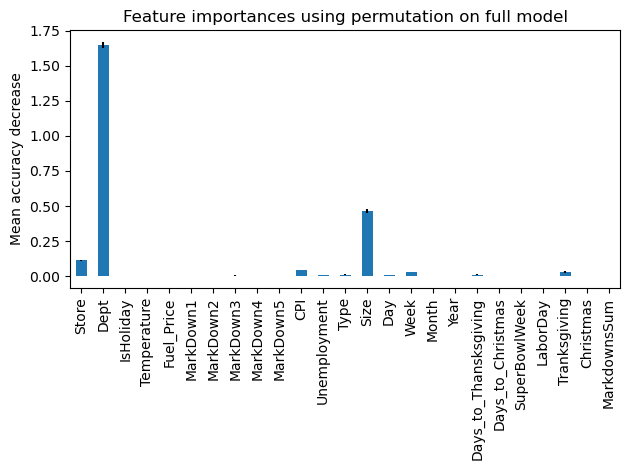

In [48]:
fig, ax = plt.subplots()
importances.plot.bar(yerr = perm.importances_std, ax=ax)
ax.set_title("Feature importances using permutation on full model")
ax.set_ylabel("Mean accuracy decrease")
fig.tight_layout()
plt.show()

##### Dept, Store, Size, CPI, Week, are the top 5 features

##### Modeling

In [49]:
# Eval metric for the competition
def WMAE(dataset, real, predicted):
    weights = dataset.IsHoliday.apply(lambda x: 5 if x else 1)
    return np.round(np.sum(weights*abs(real-predicted))/(np.sum(weights)), 2)

In [51]:
params_lgb = {'learning_rate': 0.09977309214580746, 'boosting_type': 'gbdt', 'objective': 'regression', 
               'metric': 'rmse', 'verbose': (-1,), 'sub_feature': 0.9181226651337587, 'num_leaves': 382, 
               'min_data': 74, 'max_depth': 22, random_state=0}
params_RF = {'bootstrap': True, 'max_features': 1.0, 'max_depth': None, 'min_samples_leaf': 1, 
             'min_samples_split': 4, 'n_estimators': 134, random_state=0}
models = {
          '    LGBM': lgb.LGBMRegressor(**params_lgb),
          ' XGBoost': xgb.XGBRegressor(random_state = 0, objective = 'reg:squarederror'),
          '    HGBR': HistGradientBoostingRegressor(random_state = 0),
          ' ExtraTr': ensemble.ExtraTreesRegressor(bootstrap = True, random_state = 0),
          ' RandomF': ensemble.RandomForestRegressor(**params_RF),
         }

In [52]:
def model_evaluation (name, model, models, X_train, y_train, X_valid, y_valid):
   
    rmses = []
    # Model fit
    model.fit(X_train, y_train) 
    y_preds = model.predict(X_valid)
    # RMSE
    rmse = np.sqrt(np.mean((y_valid - y_preds)**2))
    # WMAE
    wmae = WMAE(X_valid, y_valid, y_preds)
#    print(model, model.get_params())
    return rmse, wmae

In [53]:
"""
Baselines to beat

    LGBM Valid RMSE 6552.5200
 XGBoost Valid RMSE 5323.7401
    HGBR Valid RMSE 6598.0576
 ExtraTr Valid RMSE 4226.3992
 RandomF Valid RMSE 3806.9345

First Set of Baselines from this program

    LGBM Valid RMSE 5084.2302 WMAE 2778.3200  ** Hyperparameter setting
 XGBoost Valid RMSE 5591.6286 WMAE 3345.7100
    HGBR Valid RMSE 6921.8995 WMAE 4398.4000
 ExtraTr Valid RMSE 5204.2321 WMAE 2515.6600
 RandomF Valid RMSE 4422.9164 WMAE 2036.9300

Second Set of Baselines from this program



"""
for name, model in models.items():
    rmse, wmae = model_evaluation(name, model, models, X_train, y_train, X_valid, y_valid)
    print(name + ' Valid RMSE {:.4f}'.format(rmse) + ' WMAE {:.4f}'.format(wmae))

    LGBM Valid RMSE 5084.2302 WMAE 2778.3200
 XGBoost Valid RMSE 5591.6286 WMAE 3345.7100
    HGBR Valid RMSE 6921.8995 WMAE 4398.4000
 ExtraTr Valid RMSE 5204.2321 WMAE 2515.6600
 RandomF Valid RMSE 4422.9164 WMAE 2036.9300


Seems to be RandomForest it's the best baseline model by default, followed by ExtraTrees, but we can improve the score of boosting models by doing hyperparameter optimization. Also, for a more generalizable model you can do a blend of the best models at the end.

##### Here you must perform a hyperparameter tuning for all models I am sure you can improve the result......

In [54]:
##### First submission only Random Forest predictions

In [55]:
X_baseline = X[['Store','Dept','IsHoliday','Size','Week','Type','Year','Day']].copy()

In [56]:
X_train, X_valid, y_train, y_valid = model_selection.train_test_split(X_baseline, y, random_state=0, test_size=0.1)

In [57]:
RF = ensemble.RandomForestRegressor(n_estimators=60, max_depth=25, min_samples_split=3, min_samples_leaf=1)
RF.fit(X_train, y_train)

RandomForestRegressor(max_depth=25, min_samples_split=3, n_estimators=60)

In [58]:
test = data_test[['Store','Dept','IsHoliday','Size','Week','Type','Year','Day']].copy()
predict_rf = RF.predict(test)

In [59]:
sample_submission['Weekly_Sales'] = predict_rf
#sample_submission.to_csv('submission.csv',index=False)

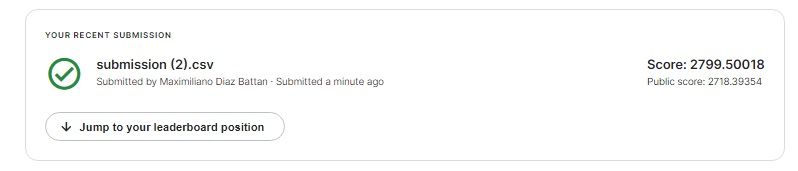

##### Second submission : Simple Blend using average of weights from two best models

In [60]:
ETR = ensemble.ExtraTreesRegressor(n_estimators=50, bootstrap = True, random_state = 0)
ETR.fit(X_train, y_train)

ExtraTreesRegressor(bootstrap=True, n_estimators=50, random_state=0)

In [61]:
predict_etr = ETR.predict(test)

In [62]:
avg_preds = (predict_rf + predict_etr) / 2

In [63]:
sample_submission['Weekly_Sales'] = avg_preds
#sample_submission.to_csv('submission.csv',index=False)

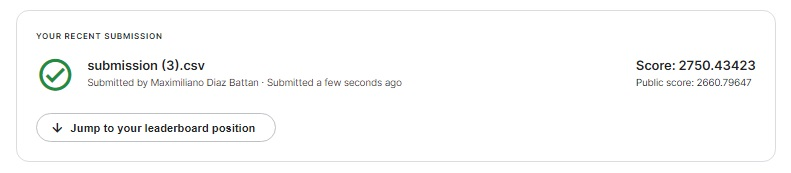

In [64]:
import session_info
session_info.show(html=False)

-----
lightgbm            4.3.0
matplotlib          3.8.0
numpy               1.26.4
pandas              2.1.4
plotly              5.19.0
session_info        1.0.0
sklearn             1.2.2
xgboost             2.0.3
-----
IPython             8.20.0
jupyter_client      8.6.0
jupyter_core        5.5.0
jupyterlab          4.0.11
notebook            7.0.8
-----
Python 3.11.8 | packaged by Anaconda, Inc. | (main, Feb 26 2024, 21:34:05) [MSC v.1916 64 bit (AMD64)]
Windows-10-10.0.22631-SP0
-----
Session information updated at 2024-03-23 13:28


##### BONUS - Random Hyperparameter tunning for LGBM (You can adapt it to any of the other classifiers)

In [65]:

# Example of Random Hyperparameter Tuning for LightGBM

#Set the minimum error arbitrarily large
min = 9999
iterations = 50
name = 'LGBM'

for i in range(iterations):
    print('iteration number', i)
   
    try:
        params = {} #initialize parameters
        params['learning_rate'] = np.random.uniform(0.08, 0.1)
        params['boosting_type'] = np.random.choice(['gbdt'])   # ['gbdt', 'dart', 'rf']
        params['objective'] = 'regression'
        params['metric'] = np.random.choice(['mae', 'rmse'])
        params['verbose'] = -1,
        params['sub_feature'] = np.random.uniform(0.9, 1)
        params['num_leaves'] = np.random.randint(290, 400)
        params['min_data'] = np.random.randint(70, 100)
        params['max_depth'] = np.random.randint(15, 30)

        clf = lgb.LGBMRegressor(random_state = 0)
        clf.set_params(**params)
        clf.fit(X_train, y_train)
        y_preds = clf.predict(X_valid)     #Create predictions on test setmae=mean_absolute_error(y_pred,y_test)
        wmae = WMAE(X_valid, y_valid, y_preds)
        rmse = np.sqrt(np.mean((y_valid - y_preds)**2))
        if wmae < min:
            min = wmae
            pp = params 
            print(name + ' Valid RMSE {:.4f}'.format(rmse) + ' WMAE {:.4f}'.format(wmae))
            print(pp)
    except  Exception as e:
        print(type(e).__name__, e)
        print('failed with')
        print(params)

print("*" * 50)
print('Minimum is: ', min)
print('Used params', pp)

iteration number 0
LGBM Valid RMSE 3735.6672 WMAE 2094.1800
{'learning_rate': 0.0814579336270931, 'boosting_type': 'gbdt', 'objective': 'regression', 'metric': 'mae', 'verbose': (-1,), 'sub_feature': 0.9745432565702249, 'num_leaves': 369, 'min_data': 85, 'max_depth': 26}
iteration number 1
LGBM Valid RMSE 3710.1293 WMAE 2092.1700
{'learning_rate': 0.08734915624333059, 'boosting_type': 'gbdt', 'objective': 'regression', 'metric': 'mae', 'verbose': (-1,), 'sub_feature': 0.9919887370985551, 'num_leaves': 350, 'min_data': 86, 'max_depth': 22}
iteration number 2
iteration number 3
iteration number 4
LGBM Valid RMSE 3615.8982 WMAE 2005.4500
{'learning_rate': 0.08785958927476775, 'boosting_type': 'gbdt', 'objective': 'regression', 'metric': 'rmse', 'verbose': (-1,), 'sub_feature': 0.9761744397641651, 'num_leaves': 382, 'min_data': 77, 'max_depth': 25}
iteration number 5
iteration number 6
iteration number 7
iteration number 8
iteration number 9
iteration number 10
iteration number 11
iteratio

In [66]:
# Random Forest Random Hyperparameter Setting
iterations = 20
min = 9999 
name = 'RF'

for i in range(iterations):
    print('iteration number', i)
    try:
        params = {} #initialize parameters
        params['bootstrap'] = np.random.choice([True])               # True / False
        params['max_features'] = np.random.choice([1.0])
        params['max_depth'] = np.random.choice([None])
        params['min_samples_leaf'] = np.random.choice([1, 2, 3, 4, 5, 6])
        params['min_samples_split'] = np.random.choice([2, 3, 4, 5, 6])
        params['n_estimators'] = np.random.randint(100, 150)

        clf = ensemble.RandomForestRegressor(random_state = 0)
        clf.set_params(**params)
        clf.fit(X_train, y_train)
        y_preds = clf.predict(X_valid)     #Create predictions on test setmae=mean_absolute_error(y_pred,y_test)
        wmae = WMAE(X_valid, y_valid, y_preds)
        rmse = np.sqrt(np.mean((y_valid - y_preds)**2))
        if wmae < min:
            min = wmae
            pp = params 
            print(name + ' Valid RMSE {:.4f}'.format(rmse) + ' WMAE {:.4f}'.format(wmae))
            print(pp)
    except  Exception as e:
        print(type(e).__name__, e)
        print('failed with')
        print(params)

print("*" * 50)
print('Minimum is: ', min)
print('Used params', pp)

iteration number 0
RF Valid RMSE 3242.8890 WMAE 1479.3500
{'bootstrap': True, 'max_features': 1.0, 'max_depth': None, 'min_samples_leaf': 4, 'min_samples_split': 5, 'n_estimators': 114}
iteration number 1
iteration number 2
iteration number 3
RF Valid RMSE 3135.1379 WMAE 1433.8500
{'bootstrap': True, 'max_features': 1.0, 'max_depth': None, 'min_samples_leaf': 3, 'min_samples_split': 2, 'n_estimators': 173}
iteration number 4
RF Valid RMSE 2925.1147 WMAE 1361.9700
{'bootstrap': True, 'max_features': 1.0, 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 4, 'n_estimators': 134}
iteration number 5
iteration number 6
iteration number 7
iteration number 8
iteration number 9
iteration number 10
iteration number 11
iteration number 12
iteration number 13
iteration number 14
iteration number 15
iteration number 16
iteration number 17
iteration number 18
iteration number 19
**************************************************
Minimum is:  1361.97
Used params {'bootstrap': True, 'max_